# Readme:
This is the main file used for generating screenshots of black text on a white background from Project Gutenberg, then training a CV model to categorise the screenshots by language.

This file should be run using a Colab Notebook with free GPU acceleration. It allows you to generate your own text screenshot data from the Project Gutenberg site in the preferred format, or import your own data in a zip folder from Google Drive. You can then create a DataLoader and model to train using the fastai library, and export the model if needed.

# Steps for training and deploying my model
**Training the model:**
*   Download 50 training images of each category (Chinese, Japanese, English, French, German) using selenium to automatically take screenshots of Project Gutenberg texts. Download 20 validation images from a different text.
*   Create a datablock to make dataloaders. Use random resized crop for the transformation and augmented transformations for each batch
*   Make a dataloaders object using the datablock
*   Train the model from an existing CV model (fine tune). Experiment with different numbers of epochs to see how it affects accuracy.

**Cleaning the data:**
*   Plot a confusion matrix to see which languages are being mixed up
*   Use fastai's data cleaner widget to display data and label to delete or switch categories.
*   Retrain the dataset and record any improvements (or worsening) of model accuracy

**Deploy finished model**
*   Export model with parameters as a .pkl file for use in inference.
*   Use chapter 2 lecture as reference to deploy the model as an API and format it as a simple prototype web app.
*   [OPTIONAL] Do the extra steps from lecture to deploy it as a real app, e.g. in GitHub pages. I don't think this is necessary or worthwhile for my applications.



# Training

## Import Modules

In [1]:
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 79.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 70.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Run for downloading data. Can ignore this block if don't need to download data
!pip install selenium
!apt-get update # install Chrome driver dependencies
!apt install chromium-chromedriver
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
!pip install Pillow
!apt-get install -y fonts-noto-cjk # install fonts so that Chrome can display Chinese characters properly


## Download images within label folders -- or load previously generated data

If already have generated data, load it using this code and skip the rest of this block:

In [18]:
# Copy data over from drive and extract it into the colab environment.
!cp "/content/gdrive/MyDrive/Colab Notebooks/language identifier CV mini-project/images - clean.zip" "/content/"
!unzip "/content/images - clean.zip" -d "/content/"
!rm "/content/images - clean.zip"

Archive:  /content/images - clean.zip
   creating: /content/images/chinese_train/
  inflating: /content/images/chinese_train/chinese_0.jpg  
  inflating: /content/images/chinese_train/chinese_1.jpg  
  inflating: /content/images/chinese_train/chinese_10.jpg  
  inflating: /content/images/chinese_train/chinese_13.jpg  
  inflating: /content/images/chinese_train/chinese_14.jpg  
  inflating: /content/images/chinese_train/chinese_15.jpg  
  inflating: /content/images/chinese_train/chinese_17.jpg  
  inflating: /content/images/chinese_train/chinese_18.jpg  
  inflating: /content/images/chinese_train/chinese_19.jpg  
  inflating: /content/images/chinese_train/chinese_2.jpg  
  inflating: /content/images/chinese_train/chinese_20.jpg  
  inflating: /content/images/chinese_train/chinese_22.jpg  
  inflating: /content/images/chinese_train/chinese_23.jpg  
  inflating: /content/images/chinese_train/chinese_24.jpg  
  inflating: /content/images/chinese_train/chinese_25.jpg  
  inflating: /content

Use the code below for generating new data:

In [ ]:
import sys
sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')

In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
import time
import os
from PIL import Image
from io import BytesIO
import random

In [ ]:
# Function to take text screenshots
def get_text_image(language, url, xpath, folder, id, driver):
    os.makedirs(folder, exist_ok=True)  # Create folder if it doesn't exist
    driver.get(url)  # Open the webpage
    # time.sleep(0.1)    # Load time if needed
    try:
        # Inject white background if necessary
        driver.execute_script("""
            document.body.style.background = 'white';
            document.documentElement.style.background = 'white';
        """)
        elem = driver.find_element(By.XPATH, xpath)  # Find the text element
        location = elem.location                     # Element's top-left position
        size = elem.size                             # Element's size (width, height)
        png = driver.get_screenshot_as_png()         # Take full-page screenshot
        im = Image.open(BytesIO(png))                # Load into PIL Image

        # Scroll the entire page vertically
        page_height = driver.execute_script("return document.body.scrollHeight")
        viewport_height = driver.execute_script("return window.innerHeight")
        max_scroll = max(0, page_height - viewport_height)

        scroll_offset = random.randint(0, max_scroll)
        driver.execute_script(f"window.scrollTo(0, {scroll_offset});")
        # time.sleep(0.1) # Load time if needed

        # Take screenshot of the visible viewport
        png = driver.get_screenshot_as_png()
        im = Image.open(BytesIO(png))

        # Random horizontal offset for more variety
        max_x = max(0, size['width'] - 200)
        offset_x = random.randint(0, int(size['width'] * 0.25))

        # Crop 200x150 from viewport
        left = location['x'] + offset_x
        top = location['y']
        right = left + 200
        bottom = top + 150
        im = im.crop((left, top, right, bottom))

        im.save(f"{folder}/{language}_{id}.jpg")      # Save image

        print(f"Saved {folder}/{language}_{id}.jpg")

    except Exception as e:
        print(f"Failed to grab image {id}: {e}")

In [ ]:
### Test downloading files in all different languages
# Setup headless Chrome for Colab
options = Options()
options.add_argument('--headless')  # No GUI
options.add_argument('--disable-gpu')
options.add_argument('--window-size=1280x800')
options.add_argument('--no-sandbox')
driver = webdriver.Chrome(options=options)


# Time how long this test takes (for 5 screenshots generated)
start = time.time()


# Example: Chinese from project Gutenberg
get_text_image(
    language='chinese',
    url='https://www.gutenberg.org/cache/epub/25561/pg25561.txt',
    xpath='/html/body/pre',  # XPath for main content block (may need tuning)
    folder='images/chinese',
    id='test',
    driver=driver
)

get_text_image(
    language='japanese',
    url='https://www.gutenberg.org/cache/epub/35327/pg35327.txt',
    xpath='/html/body/pre',  # XPath for main content block (may need tuning)
    folder='images/japanese',
    id='test',
    driver=driver
)

get_text_image(
    language='english',
    url='https://www.gutenberg.org/cache/epub/1342/pg1342.txt',
    xpath='/html/body/pre',  # XPath for main content block (may need tuning)
    folder='images/english',
    id='test',
    driver=driver
)

get_text_image(
    language='french',
    url='https://www.gutenberg.org/cache/epub/2650/pg2650.txt',
    xpath='/html/body/pre',  # XPath for main content block (may need tuning)
    folder='images/french',
    id='test',
    driver=driver
)

get_text_image(
    language='german',
    url='https://www.gutenberg.org/cache/epub/6343/pg6343.txt',
    xpath='/html/body/pre',  # XPath for main content block (may need tuning)
    folder='images/german',
    id='test',
    driver=driver
)


end = time.time()
print(f"Elapsed time: {end - start:.2f} seconds")


driver.quit()  # Close the browser

Saved images/chinese/chinese_test.jpg
Saved images/japanese/japanese_test.jpg
Saved images/english/english_test.jpg
Saved images/french/french_test.jpg
Saved images/german/german_test.jpg
Elapsed time: 6.02 seconds


In [ ]:
### Loop to generate 50 screenshots for each language

def get_text_images(languages, urls, xpaths, folders, max_n):
    '''Download max_n random screenshots of text in different languages, by
    going to the text file and xpaths specified, and save to the folders
    specified'''

    # Setup headless Chrome for Colab
    options = Options()
    options.add_argument('--headless')  # No GUI
    options.add_argument('--disable-gpu')
    options.add_argument('--window-size=1280x800')
    options.add_argument('--no-sandbox')
    driver = webdriver.Chrome(options=options)

    for language, url, xpath, folder in zip(languages, urls, xpaths, folders):
        for i in range(max_n):
            get_text_image(
                language=language,
                url=url,
                xpath=xpath,
                folder=folder,
                id=i,
                driver=driver
            )

    driver.quit()  # Close the browser
    return

In [ ]:
# Download the training sets
get_text_images(
    languages=['chinese', 'japanese', 'english', 'french', 'german'],
    urls=[
        'https://www.gutenberg.org/cache/epub/25561/pg25561.txt',
        'https://www.gutenberg.org/cache/epub/35327/pg35327.txt',
        'https://www.gutenberg.org/cache/epub/1342/pg1342.txt',
        'https://www.gutenberg.org/cache/epub/2650/pg2650.txt',
        'https://www.gutenberg.org/cache/epub/6343/pg6343.txt'
    ],
    xpaths=[
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre'
    ],
    folders=[
        'images/chinese_train',
        'images/japanese_train',
        'images/english_train',
        'images/french_train',
        'images/german_train'
    ],
    max_n=50
)

# Download the validation sets
get_text_images(
    languages=['chinese', 'japanese', 'english', 'french', 'german'],
    urls=[
        'https://www.gutenberg.org/cache/epub/27686/pg27686.txt',
        'https://www.gutenberg.org/cache/epub/39287/pg39287.txt',
        'https://www.gutenberg.org/cache/epub/1200/pg1200.txt',
        'https://www.gutenberg.org/cache/epub/58254/pg58254.txt',
        'https://www.gutenberg.org/cache/epub/14075/pg14075.txt'
    ],
    xpaths=[
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre',
        '/html/body/pre'
    ],
    folders=[
        'images/chinese_valid',
        'images/japanese_valid',
        'images/english_valid',
        'images/french_valid',
        'images/german_valid'
    ],
    max_n=20
)

Saved images/chinese_train/chinese_0.jpg
Saved images/chinese_train/chinese_1.jpg
Saved images/chinese_train/chinese_2.jpg
Saved images/chinese_train/chinese_3.jpg
Saved images/chinese_train/chinese_4.jpg
Saved images/chinese_train/chinese_5.jpg
Saved images/chinese_train/chinese_6.jpg
Saved images/chinese_train/chinese_7.jpg
Saved images/chinese_train/chinese_8.jpg
Saved images/chinese_train/chinese_9.jpg
Saved images/chinese_train/chinese_10.jpg
Saved images/chinese_train/chinese_11.jpg
Saved images/chinese_train/chinese_12.jpg
Saved images/chinese_train/chinese_13.jpg
Saved images/chinese_train/chinese_14.jpg
Saved images/chinese_train/chinese_15.jpg
Saved images/chinese_train/chinese_16.jpg
Saved images/chinese_train/chinese_17.jpg
Saved images/chinese_train/chinese_18.jpg
Saved images/chinese_train/chinese_19.jpg
Saved images/chinese_train/chinese_20.jpg
Saved images/chinese_train/chinese_21.jpg
Saved images/chinese_train/chinese_22.jpg
Saved images/chinese_train/chinese_23.jpg
Sa

Training texts

Chinese:
https://www.gutenberg.org/cache/epub/25561/pg25561.txt

Japanese:
https://www.gutenberg.org/cache/epub/35327/pg35327.txt

English:
https://www.gutenberg.org/cache/epub/1342/pg1342.txt

French:
https://www.gutenberg.org/cache/epub/2650/pg2650.txt

German:
https://www.gutenberg.org/cache/epub/6343/pg6343.txt

Validation texts

Chinese:
https://www.gutenberg.org/cache/epub/27686/pg27686.txt

Japanese:
https://www.gutenberg.org/cache/epub/39287/pg39287.txt

English:
https://www.gutenberg.org/cache/epub/1200/pg1200.txt

French:
https://www.gutenberg.org/cache/epub/58254/pg58254.txt

German:
https://www.gutenberg.org/cache/epub/14075/pg14075.txt

## Make a DataLoaders object

In [3]:
def get_label(path):
    return path.name.split('_')[0]

def data_splitter(path_list):

    train_i = []
    valid_i = []

    for i in range(len(path_list)):
        if path_list[i].parent.name.split('_')[1] == 'train':
            train_i.append(i)
        elif path_list[i].parent.name.split('_')[1] == 'valid':
            valid_i.append(i)

    return train_i, valid_i

In [4]:
text_screenshots = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=data_splitter,
    get_y=get_label,
    item_tfms=RandomResizedCrop(size=(100, 150)),
    batch_tfms=aug_transforms(do_flip=False, mult=0.5)
)

In [19]:
path = Path('images')
dls = text_screenshots.dataloaders(path)

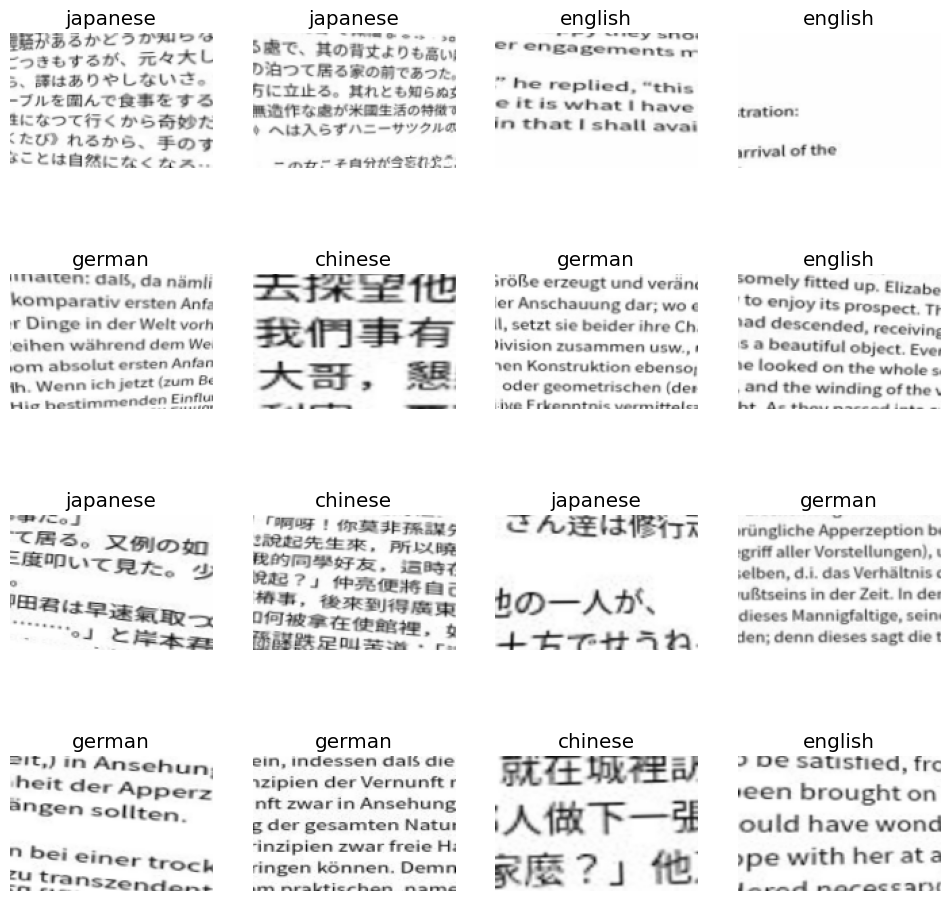

In [20]:
dls.train.show_batch(max_n=16, nrows=4)

## Create and train the learner

In [23]:
# learn = vision_learner(dls, resnet101, metrics=error_rate)
# learn.fine_tune(10)

# Iteration 2:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.freeze()
learn.fit_one_cycle(3)
learn.unfreeze()
learn.fit_one_cycle(15)

epoch,train_loss,valid_loss,error_rate,time
0,2.485876,1.693302,0.634409,00:01
1,2.233555,1.424626,0.634409,00:01
2,2.090897,1.394913,0.569892,00:01


epoch,train_loss,valid_loss,error_rate,time
0,1.537718,1.295222,0.537634,00:01
1,1.471213,1.198172,0.516129,00:01
2,1.401826,1.567234,0.483871,00:01
3,1.344249,2.204871,0.494624,00:01
4,1.321602,3.311117,0.602151,00:01
5,1.275656,5.857263,0.623656,00:01
6,1.220797,3.349093,0.526882,00:01
7,1.169301,2.093422,0.473118,00:01
8,1.160798,2.718170,0.569892,00:01
9,1.154194,1.554016,0.483871,00:01


In [24]:
# Export the learner so I can access the model later
learn.export('language_identifier_model.pkl')

## Evaluate Model and Clean Data

In [21]:
learn.predict('images/german_valid/german_0.jpg')

('german',
 tensor(3),
 tensor([2.0990e-03, 1.8103e-01, 3.8283e-01, 4.3379e-01, 2.5554e-04]))

In [ ]:
learn.dls.vocab

['chinese', 'english', 'french', 'german', 'japanese']

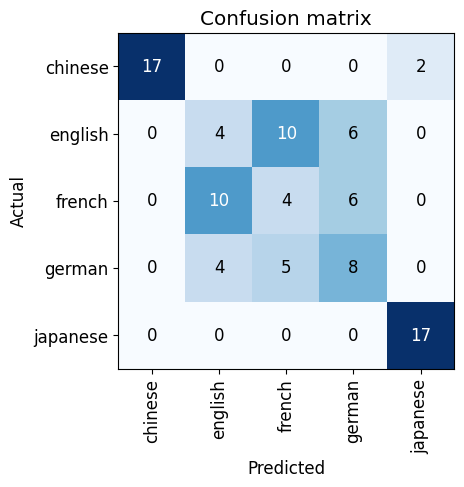

In [25]:
# Plot the confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

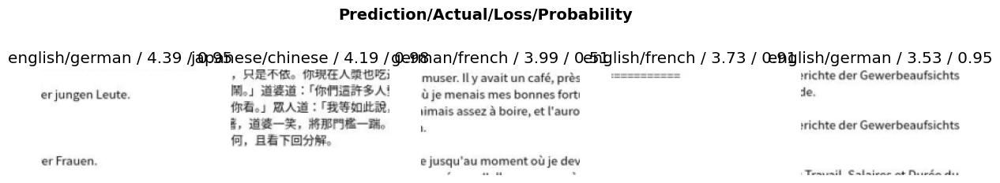

In [26]:
# Plot top loss images for reference
interp.plot_top_losses(5, nrows=1)

In [ ]:
# Open the image classifier cleaner GUI to mark images to delete
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# Delete items marked to delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
# Move the items marked to move
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
# Zip the new images folder and download to laptop
!zip -r /content/images_clean.zip /content/images
from google.colab import files
files.download("/content/images_clean.zip")

# Congratulations!

Exported a decent model, ready for me to deploy in a little app! Then I can move on to lecture 3 of fastai!